In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from itertools import combinations
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random

import plotting_functions as pf

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
plate_palette = sns.color_palette("husl", n_colors=3)
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


# QC plotting - 200 /500 UMI merged adata

In [3]:
adata = sc.read("../IGVF_analysis/preprocessed_tissues/GonadsFemalepreprocessed.h5ad")


In [4]:
adata.layers['raw_counts'] = adata.X.copy()


In [5]:
adata

AnnData object with n_obs × n_vars = 1187438 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch'
    var: 'gene_name'
    layers: 'raw_counts'

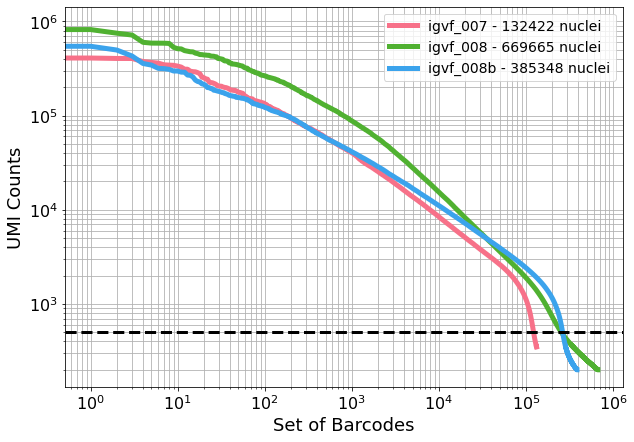

In [6]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

In [7]:
# set var names to be gene names, not gene ID
adata.var_names  = adata.var['gene_name']
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


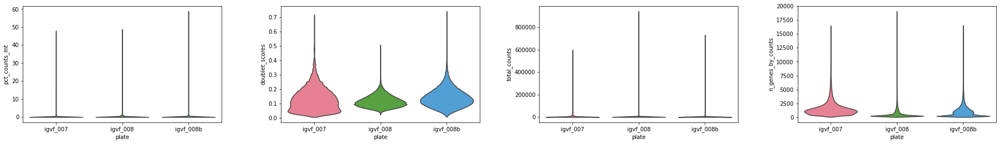

In [8]:
plate_palette = sns.color_palette("husl", n_colors=3)

sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

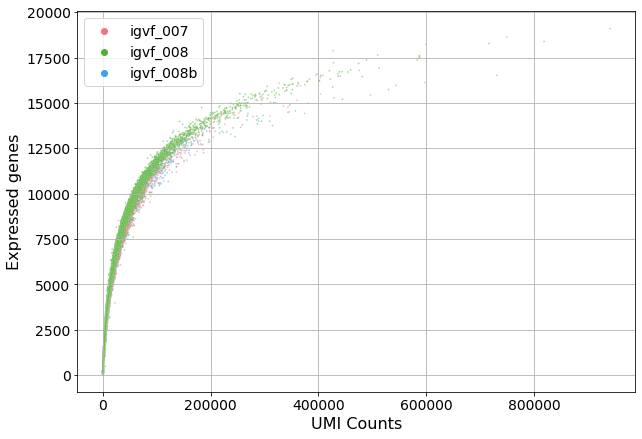

In [9]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [10]:
adatas = adata[(adata.obs['total_counts'] < 10000) & (adata.obs['n_genes_by_counts'] < 2000), :]


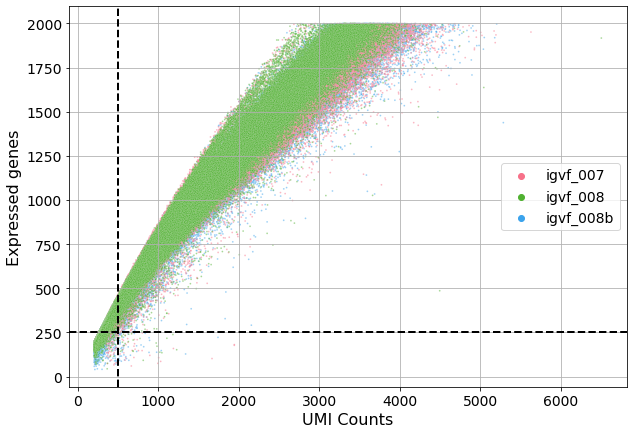

In [11]:
pf.plot_genes_by_counts(adatas, category_column='plate', figsize=(10, 7))

plt.axvline(x=500, color='k', linestyle='--', linewidth=2)
plt.axhline(y=250, color='k', linestyle='--', linewidth=2)

plt.show()

In [12]:
adatas[(adatas.obs['total_counts'] > 500) & (adatas.obs['n_genes_by_counts'] < 250), :]


View of AnnData object with n_obs × n_vars = 113 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'raw_counts'

# QC plotting - filtered data
500 UMI, 250 genes, 1% mito, 0.25 doublet score


In [3]:
adata = sc.read("../IGVF_analysis/tissue_processed_500umi/GonadsFemale_processed.h5ad")


In [4]:
adata

AnnData object with n_obs × n_vars = 588828 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means

In [9]:
print(adata.obs['Genotype'].value_counts())

adata = adata[adata.obs['Genotype'] != "tie",:]

print(adata.obs['Genotype'].value_counts())

Genotype
NODJ      89835
AJ        76108
129S1J    74642
NZOJ      72676
PWKJ      70541
WSBJ      70186
B6J       69699
CASTJ     65117
tie          24
Name: count, dtype: int64
Genotype
NODJ      89835
AJ        76108
129S1J    74642
NZOJ      72676
PWKJ      70541
WSBJ      70186
B6J       69699
CASTJ     65117
Name: count, dtype: int64


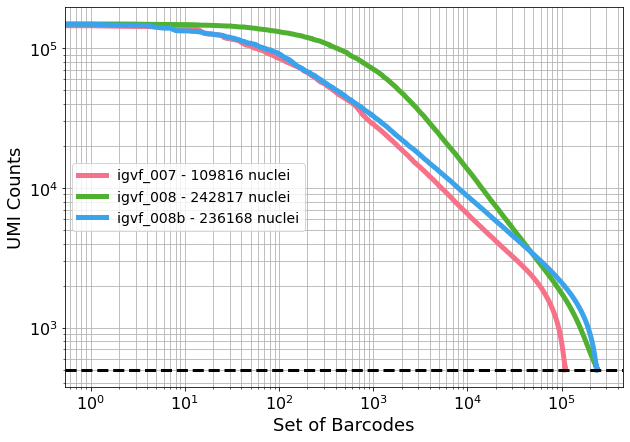

In [5]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

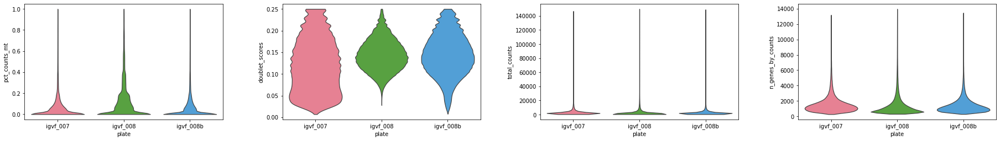

In [6]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

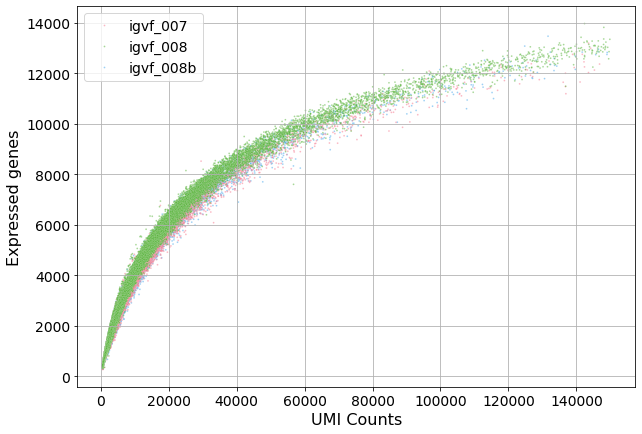

In [7]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

# Check clustering
Plate, sex, genotype

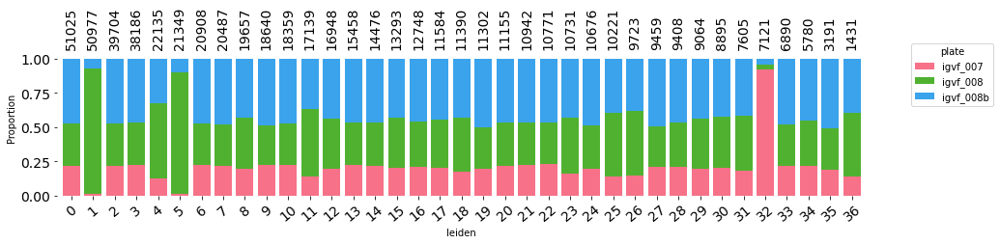

In [5]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)


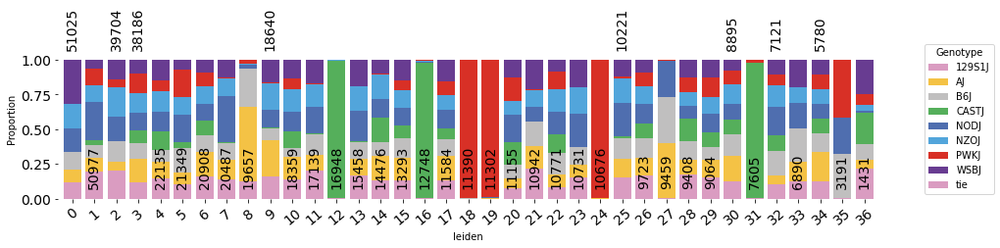

In [6]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


/tmp/ipykernel_1615071/3156761390.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)


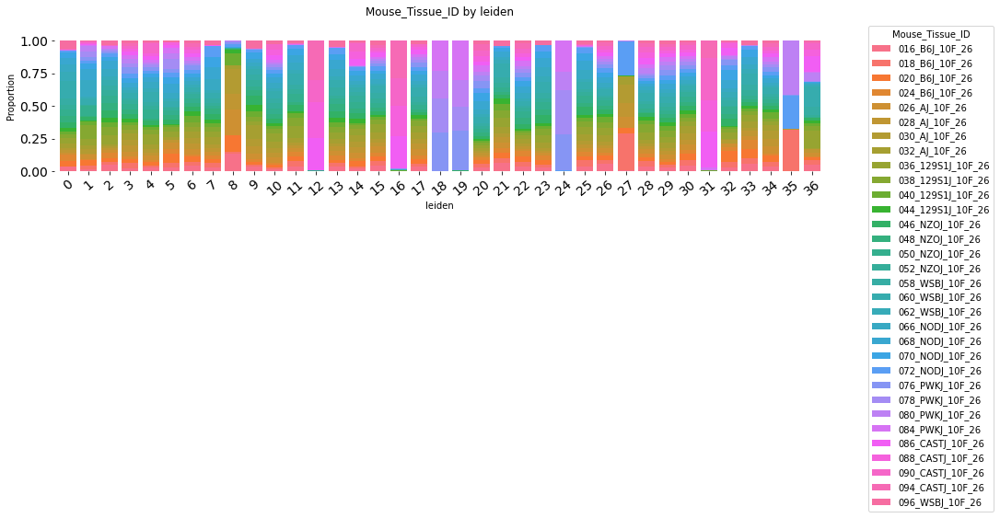

In [10]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Mouse_Tissue_ID',
                               flip=False, fsize = (15,3), 
                               annotations = False)

In [11]:
df = adata.obs[['Mouse_Tissue_ID','Estrus_cycle','plate']]
df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
df['Estrus_cycle'] = df['Estrus_cycle'].astype('str').replace('nan', 'NA')
df['Estrus_cycle'].value_counts()
adata.obs['Estrus_cycle'] = df['Estrus_cycle']

/tmp/ipykernel_1615071/3645533663.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
/tmp/ipykernel_1615071/3645533663.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
/tmp/ipykernel_1615071/3645533663.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

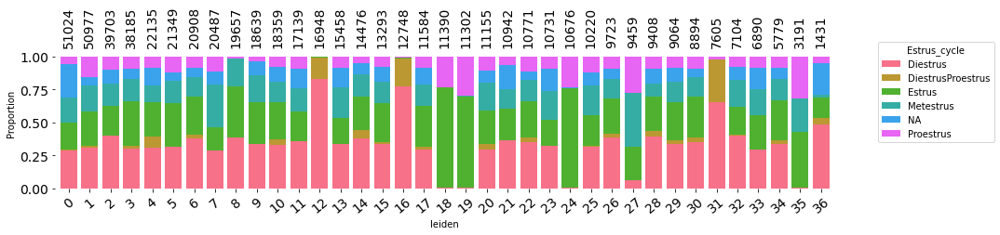

In [13]:
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Estrus_cycle',
                               flip=False, fsize = (15,3), 
                               annotations = True)

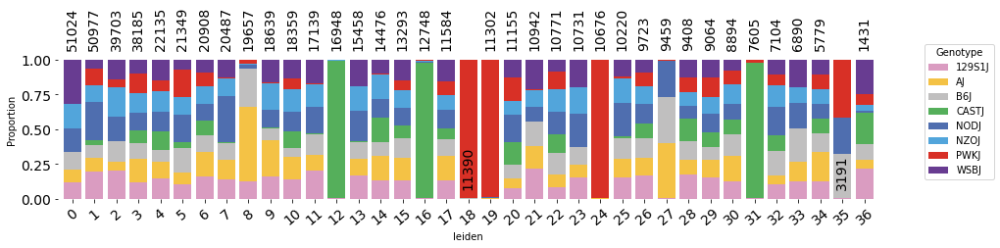

In [14]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


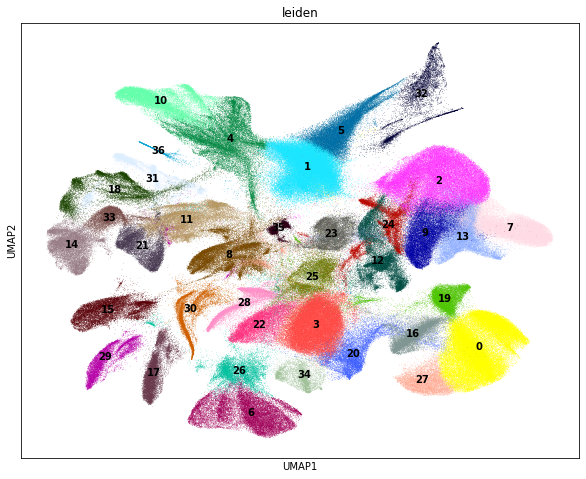

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


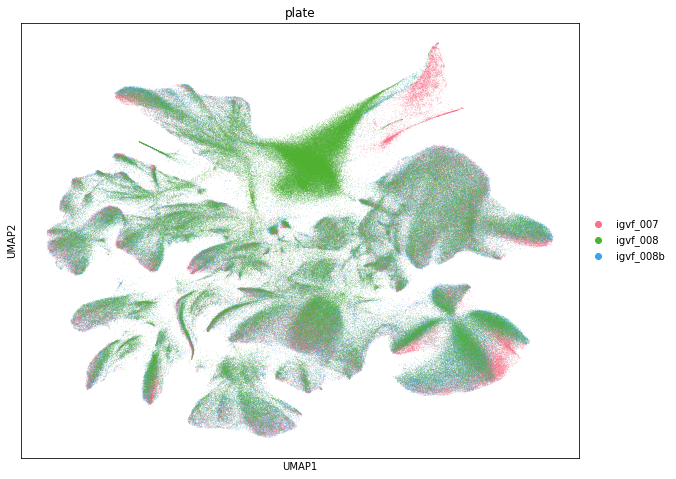

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


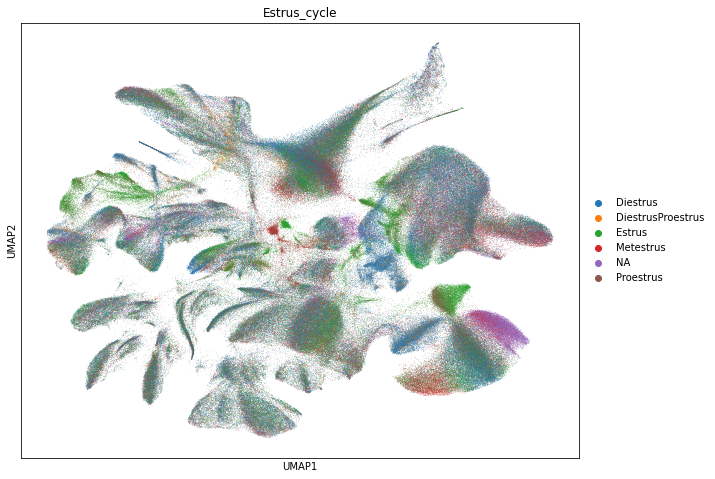

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


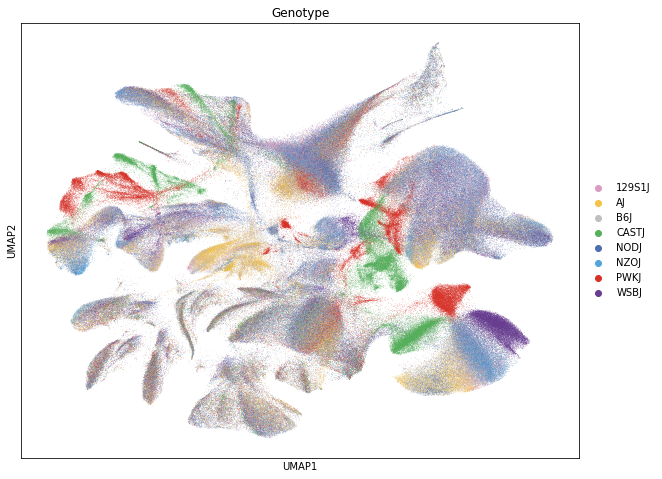

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


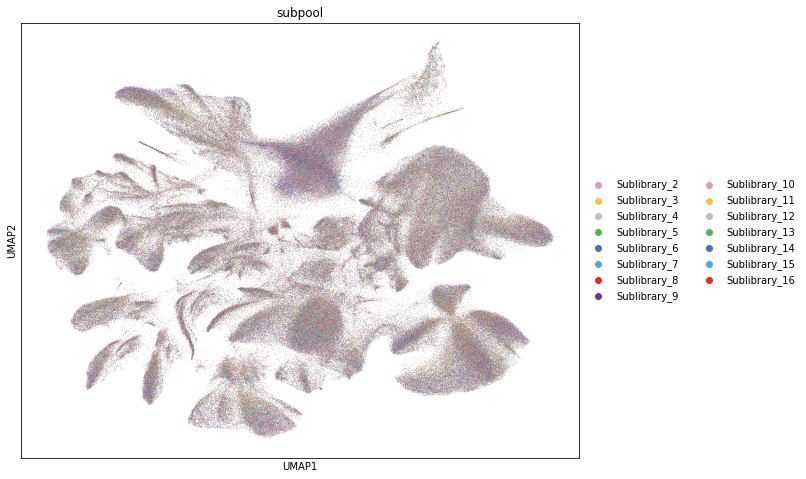

In [15]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Estrus_cycle'], size = 0.8)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)

sc.pl.umap(adata, color=['subpool'], size = 0.8, palette = geno_palette)




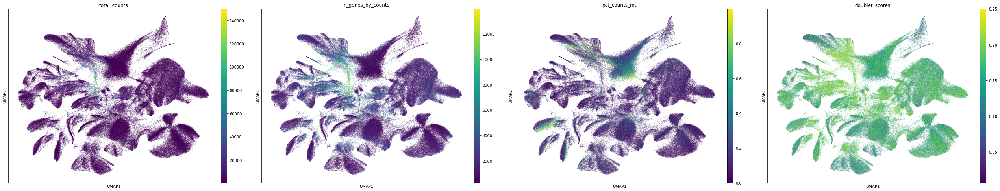

In [16]:
sc.pl.umap(adata, color=['total_counts','n_genes_by_counts','pct_counts_mt', 'doublet_scores'], size = 1)


In [18]:
adata.var_names  = adata.var['gene_name']


categories: 0, 1, 2, etc.
var_group_labels: Adrenal, Brain, Female, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


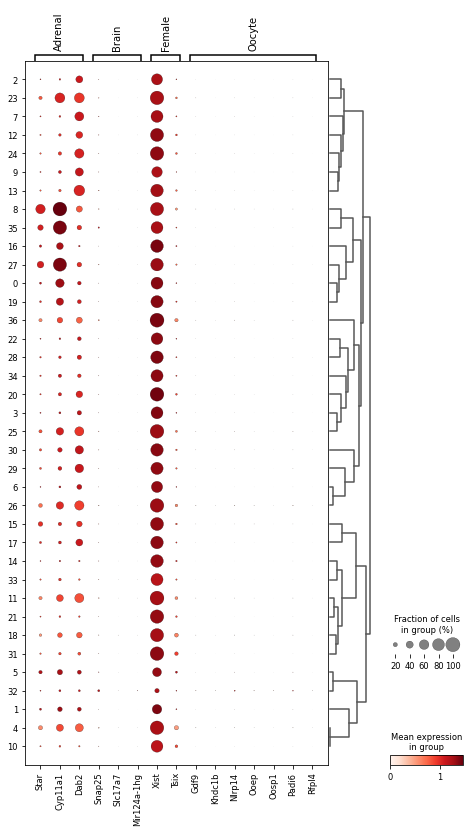

In [27]:
marker_genes_dict = {
    "Adrenal": ['Star','Cyp11a1','Dab2'],
    "Brain": ['Snap25','Slc17a7','Mir124a-1hg'],
    "Female": ["Xist","Tsix"],
    "Oocyte": ["Gdf9","Khdc1b","Nlrp14","Ooep",
                  "Oosp1","Padi6","Rfpl4"]

}


sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


# Remove large low-quality clusters and re-cluster

In [30]:
adata = adata[~adata.obs['leiden'].isin(["1","5","32"])]



In [31]:
adata

View of AnnData object with n_obs × n_vars = 509374 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'

In [32]:
adata.uns['log1p']["base"] = None

In [33]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas = adata[:, adata.var.highly_variable]



/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [34]:
sc.pp.regress_out(adatas, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas, max_value=10)

sc.tl.pca(adatas, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas, resolution = 1)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarni

In [35]:
sc.tl.umap(adatas, min_dist = 0.5, spread =2.0)

In [36]:
adata.uns['neighbors'] = adatas.uns['neighbors']
adata.uns['leiden'] = adatas.uns['leiden']
adata.uns['umap'] = adatas.uns['umap']
adata.obs['leiden'] = adatas.obs['leiden']
adata.obsm = adatas.obsm
adata.obsp = adatas.obsp
adata.write_h5ad('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


In [37]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


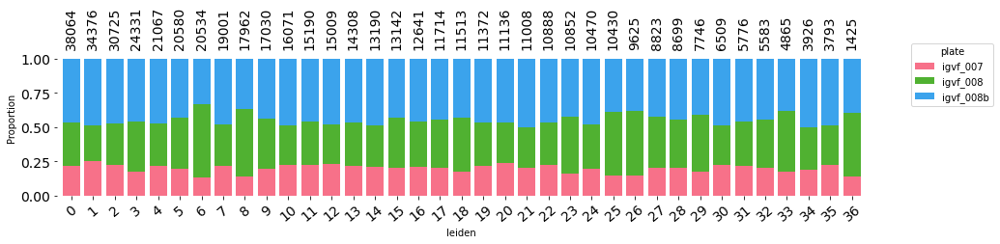

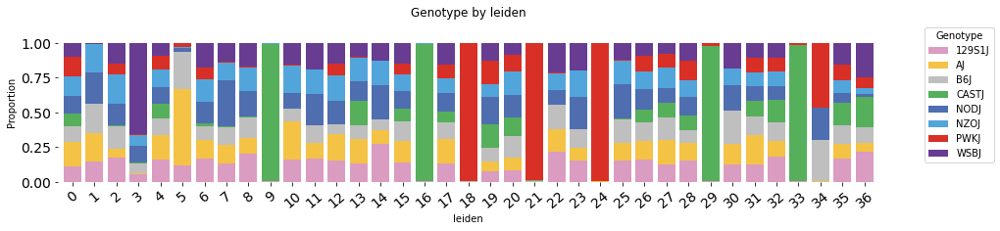

In [38]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = False)


In [ ]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Mouse_Tissue_ID',
                               flip=False, fsize = (15,3), 
                               annotations = False)

In [ ]:
unique_clusters = adata.obs['leiden'].unique()

result_dict = {'leiden': [], 'n_mice_per_cluster': []}

for cluster in unique_clusters:
    # Filter data for the specific cluster
    cluster_data = adata.obs.loc[adata.obs['leiden'] == cluster, 'Mouse_Tissue_ID'].value_counts()
    cumulative_percentage = cluster_data.cumsum() / cluster_data.sum()
    num_tissue_ids_percent = (cumulative_percentage <= 0.9).sum() 
    
    result_dict['leiden'].append(cluster)
    result_dict['n_mice_per_cluster'].append(num_tissue_ids_percent)

result_df = pd.DataFrame(result_dict)

result_df['leiden'] = pd.to_numeric(result_df['leiden'])
result_df = result_df.sort_values(by='leiden')
result_df['leiden'] = result_df['leiden'].astype(str)

plt.figure(figsize=(13,2.5))
plt.bar(result_df['leiden'], result_df['n_mice_per_cluster'])
plt.xlabel('leiden')
plt.ylabel('# mice for 80% of the cluster')

plt.axhline(y=4, color='black', linestyle='--')
plt.axhline(y=1, color='red', linestyle='--')


plt.show()

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


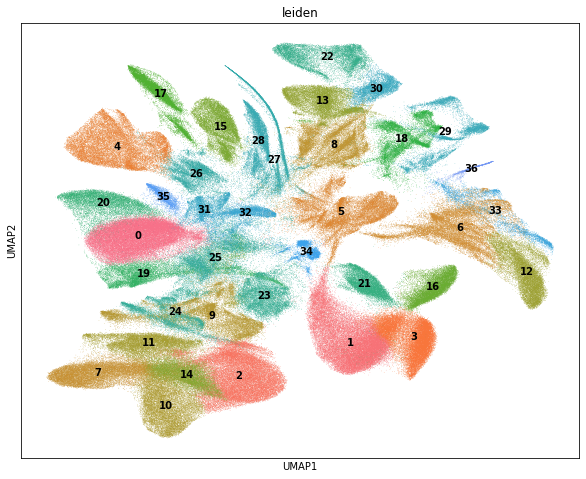

In [39]:
plt.rcParams['figure.figsize'] = (10, 8)

leiden_palette = sns.color_palette("husl", n_colors=51)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data',palette=leiden_palette)




/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


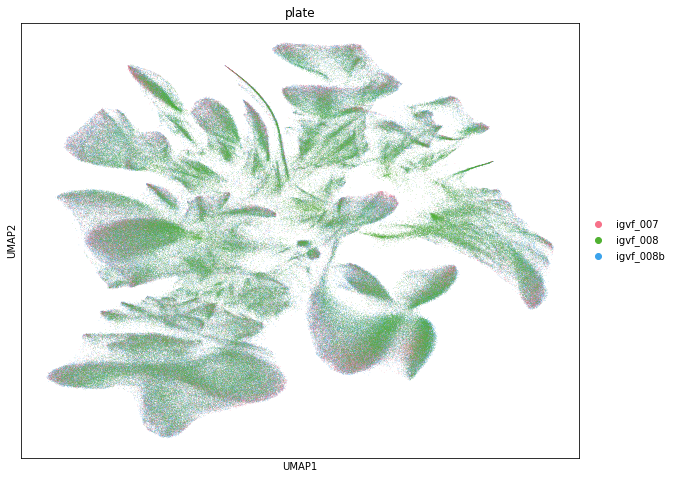

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


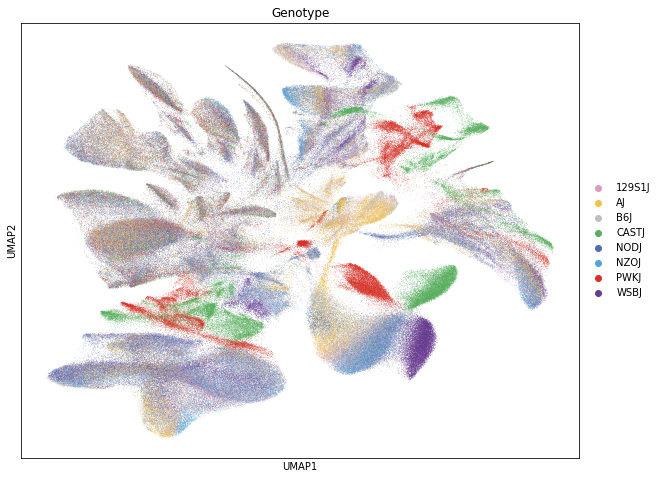

In [40]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


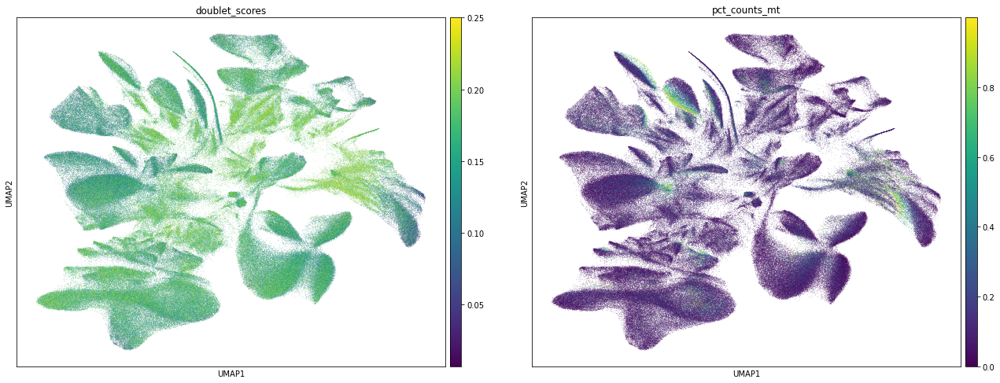

In [41]:
sc.pl.umap(adata, color=['doublet_scores','pct_counts_mt'], size=1)


# Check marker gene expression

In [3]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


categories: 0, 1, 2, etc.
var_group_labels: Granulosa, Stromal, Fibroblast, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


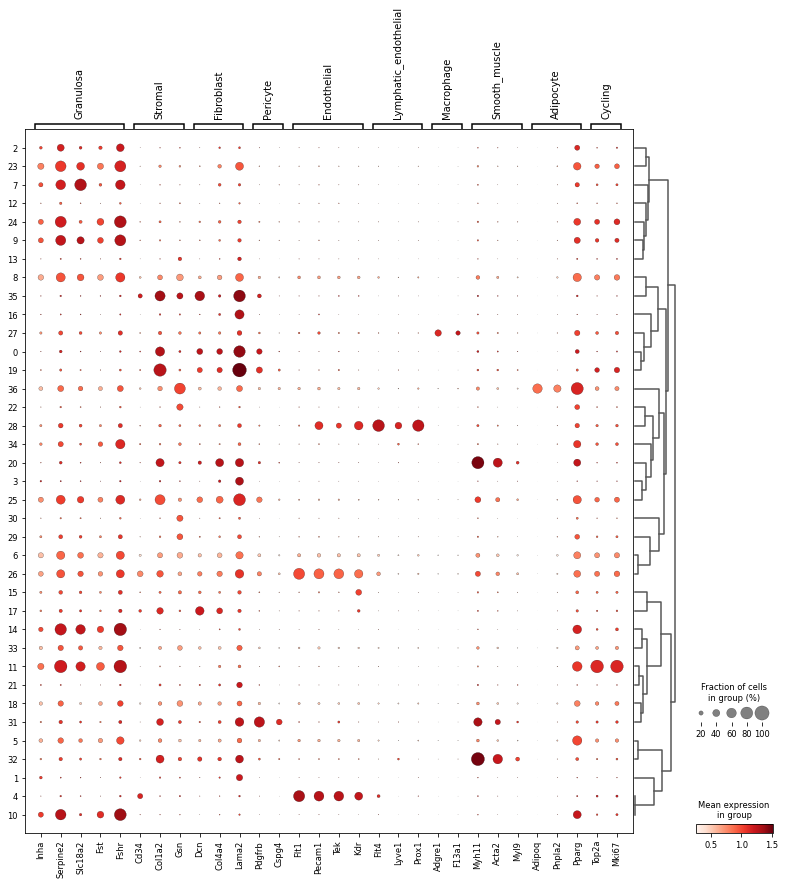

In [43]:
curated_marker_genes_dict = {
    "Granulosa": ['Inha','Serpine2','Slc18a2','Fst','Fshr'],
    "Stromal": ["Cd34","Col1a2","Gsn"],
    "Fibroblast": ["Dcn","Col4a4","Lama2"],
    "Pericyte": ["Pdgfrb","Cspg4"],
    "Endothelial": ["Flt1","Pecam1","Tek","Kdr"],
    "Lymphatic_endothelial": ['Flt4','Lyve1','Prox1'],
    "Macrophage": ["Adgre1","F13a1"],
    "Smooth_muscle": ["Myh11","Acta2","Myl9"],
    "Adipocyte": ["Adipoq","Pnpla2","Pparg"],
    "Cycling": ["Top2a","Mki67"],

               
}

sc.pl.dotplot(adata, curated_marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


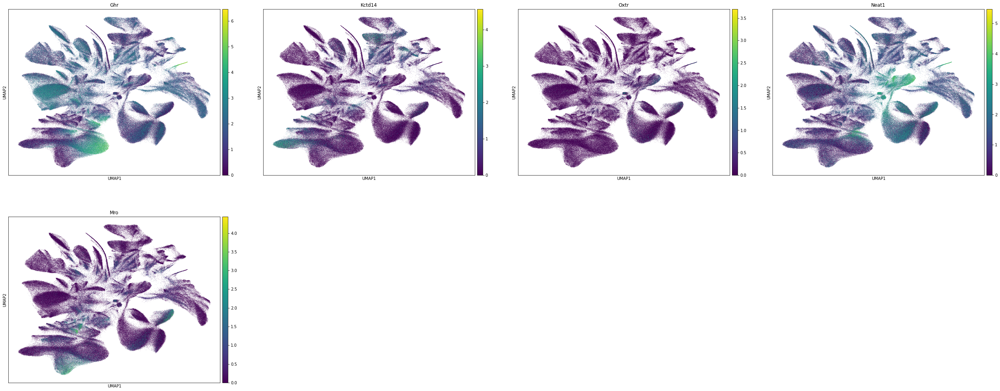

In [35]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['Ghr','Kctd14','Oxtr','Neat1','Mro'], size=1, sort_order = True)

#CYP17A1 and INSL3

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


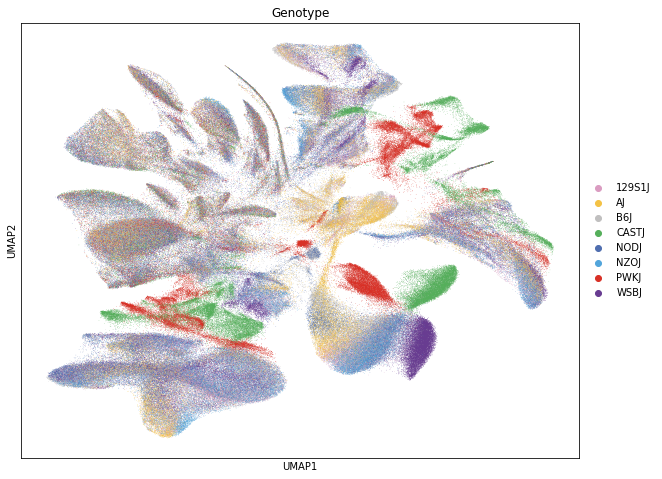

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


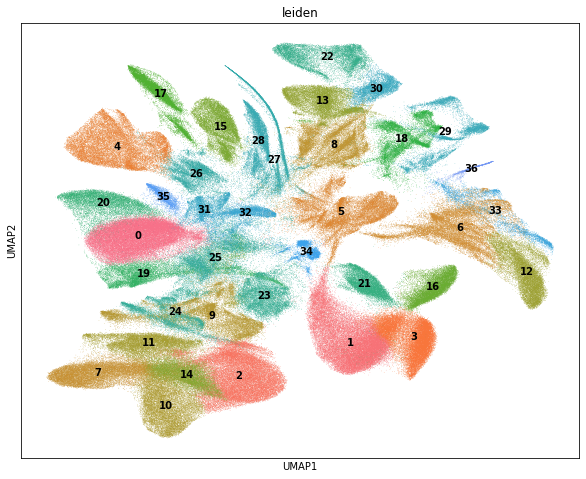

In [15]:
sc.pl.umap(adata, color=['Genotype'], size=1,palette = geno_palette)
sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

categories: 0, 1, 2, etc.
var_group_labels: Active_CL, Antral_Mural, Atretic, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


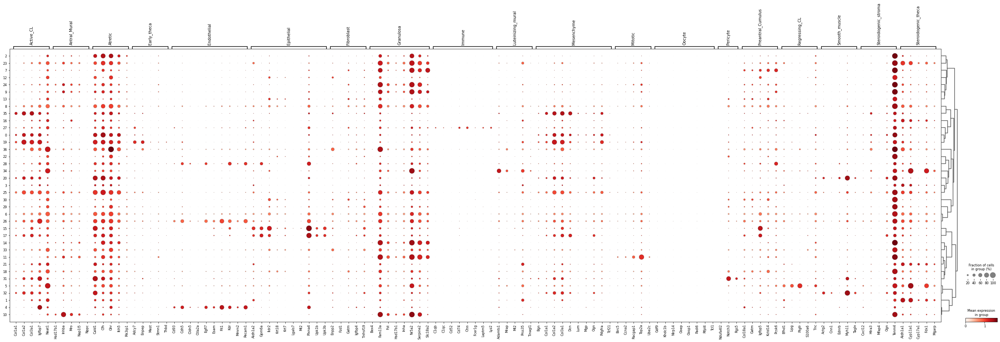

In [25]:
my_markers_df = pd.read_csv("IGVF_curated_markers.csv")
my_markers_df = my_markers_df[my_markers_df['Gene'].isin(adata.var_names)]
my_markers_df = my_markers_df[my_markers_df['Tissue'] == 'GonadsFemale']

marker_genes_dict = my_markers_df.groupby('Subtype')['Gene'].agg(list).to_dict()
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)
